## Get prediction

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

import sys
import numpy as np
import torch

sys.path.insert(0, '..')
from isegm.ritm.utils import vis, exp

from isegm.inference import utils
from isegm.ritm.inference.evaluation_explainable import evaluate_sample
from isegm.ritm.inference.predictors import get_predictor
from isegm.ritm.model.is_explainable_ritm_hrnet_model import RitmHRNetModelExplainable
from isegm.data.preprocess import Preprocessor
from isegm.inference.clicker import Clicker, DynamicClicker

device = torch.device('cuda:0')
cfg = exp.load_config_file('config.yml', return_edict=True)

In [2]:
EVAL_MAX_CLICKS = 20
MODEL_THRESH = 0.5
TRAINING_OUTPUT_PATH = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/training'

# checkpoint_path = utils.find_checkpoint_from_training(TRAINING_OUTPUT_PATH, 'RITM-ritm_standard_aug')
# checkpoint_path = utils.find_checkpoint_from_training(TRAINING_OUTPUT_PATH, 'RITM-dynamic_clicks big dataset')
# checkpoint_path = utils.find_checkpoint_from_training(TRAINING_OUTPUT_PATH, 'RITM-dynamic clicks BceDice loss')
# checkpoint_path = utils.find_checkpoint_from_training(TRAINING_OUTPUT_PATH, 'RITM-ritm_standard big_dataset')
# checkpoint_path = utils.find_checkpoint_from_training(TRAINING_OUTPUT_PATH, 'distributed_dynamic_disks')
# checkpoint_path = utils.find_checkpoint_from_training(TRAINING_OUTPUT_PATH, 'RITM-LIDC_2D_FULL-Dynamic disks')

# checkpoint_path = utils.find_checkpoint_from_training(TRAINING_OUTPUT_PATH, 'KITS23_2D_TUMOURS-Static disks')
# checkpoint_path = utils.find_checkpoint_from_training(TRAINING_OUTPUT_PATH, 'KITS23_2D_TUMOURS-Dynamic disks')
# checkpoint_path = utils.find_checkpoint_from_training(TRAINING_OUTPUT_PATH, 'Static disks small dataset batch_40')
# checkpoint_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/training/2024-02-03/11-59-20-RITM-ONE_SAMPLE Dynamic clicks unlocked backbone unlocked click head/checkpoints/best_model.pth'
# print(checkpoint_path)

# checkpoint_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/training/final_models/RITM-LIDC_2D-Static disks/checkpoints/best_model.pth'
# checkpoint_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/training/final_models/RITM-LIDC_2D-Dynamic disks/checkpoints/best_model.pth'

# checkpoint_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/training/final_models/RITM-LIDC_2D_FULL-Static disks/checkpoints/best_model.pth'
checkpoint_path = '/gpfs/space/projects/PerkinElmer/donatasv_experiments/repos/ClickSEG/outputs/training/final_models/RITM-LIDC_2D_FULL-Dynamic disks/checkpoints/best_model.pth'

saved_model = utils.load_is_model(checkpoint_path, 'cpu', model_type='RITM')

# saved_model = utils.load_is_model(checkpoint_path, 'cpu', train_config=train_config)
# saved_model = saved_model.to('cpu')
model = RitmHRNetModelExplainable(
        pipeline_version='s2',
        width=32,
        ocr_width=128,
        small=False,
        with_aux_output=True,
        use_leaky_relu=True,
        use_rgb_conv=False,
        use_disks=True,
        norm_radius=5,
        with_prev_mask=True,
        dynamic_radius_points=True,
        dist_map_mode='disk',
        overwrite_click_maps=False
    )

model.load_state_dict(saved_model.state_dict())
model = model.to(device)
model.eval()

# Possible choices: 'NoBRS', 'f-BRS-A', 'f-BRS-B', 'f-BRS-C', 'RGB-BRS', 'DistMap-BRS'
# brs_mode = 'NoBRS'
brs_mode = 'NoBRSExplainable'

# zoom_in_params = None
zoom_in_params = dict({
    'recompute_click_size_on_zoom': False,
})
# zoom_in_params['skip_clicks'] = 0

predictor = get_predictor(model, brs_mode, device, prob_thresh=MODEL_THRESH, zoom_in_params=zoom_in_params) 

Model args: {'width': 32, 'ocr_width': 128, 'with_aux_output': True, 'use_leaky_relu': True, 'use_rgb_conv': False, 'dist_map_mode': 'disk', 'norm_radius': 5, 'with_prev_mask': True, 'overwrite_click_maps': False, 'model_type': 'RITM'}


In [7]:
# Possible choices: 'DAVIS', 'BRATS', 'LIDC', 'LIDC_2D_VAL', 'LIDC_2D_256_VAL', 'LIDC_CROPS_BOXED', 'LIDC_CROPS_WHITENED', 'LIDC_CROPS'
DATASET = 'LIDC_2D_TEST'
preprocessor = Preprocessor()
preprocessor.normalize = True
preprocessor.windowing = True
preprocessor.window_min = -900
preprocessor.window_max = 600
# DATASET = 'KITS23_2D_TUMOURS_VAL'
# preprocessor = Preprocessor()
# preprocessor.normalize = True
# preprocessor.windowing = True
# preprocessor.window_min = -150
# preprocessor.window_max = 250
# preprocessor.convert_to_rgb = False

dataset = utils.get_dataset(DATASET, cfg, preprocessor=preprocessor)

[0.70417 0.77818 0.82716 0.85464 0.83713 0.84441 0.84956 0.85841 0.86096
 0.86275 0.86429 0.86559 0.87027 0.87659 0.87774 0.88095 0.87706 0.87706
 0.88073 0.88073]


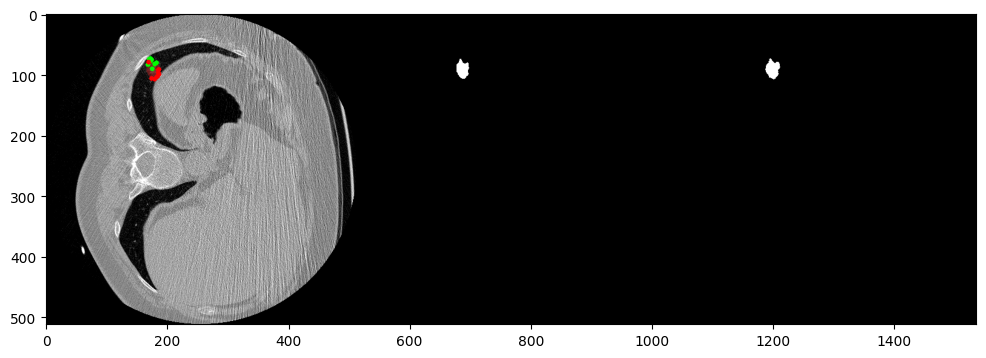

In [13]:
sample_id = 115#610 #17, 55, 57, 63, 66, 67, 69, 71, 78, 86
TARGET_IOU = 1
EVAL_MAX_CLICKS = 20

use_init_mask = False
sample = dataset.get_sample(sample_id)

gt_mask = sample.gt_mask
image = sample.image
init_mask = np.zeros_like(gt_mask)

if use_init_mask and sample.init_mask is not None:
    init_mask = sample.init_mask

#mode = min, avg, max, distributed
clicker = DynamicClicker(gt_mask, mode='locked', allow_overlap=True)

clicks_list, ious_arr, pred, pred_list, info_list = evaluate_sample(image, gt_mask, predictor, clicker,
                                              pred_thr=MODEL_THRESH, 
                                              max_iou_thr=TARGET_IOU, max_clicks=EVAL_MAX_CLICKS)

pred_mask = pred_list[-1] > MODEL_THRESH
draw = vis.draw_with_blend_and_clicks(image, mask=pred_mask, clicks_list=clicks_list)
draw = np.concatenate((draw,
    255 * pred_mask[:, :, np.newaxis].repeat(3, axis=2),
    255 * (gt_mask > 0)[:, :, np.newaxis].repeat(3, axis=2)
), axis=1)
print(np.round(ious_arr, 5))
plt.figure(figsize=(12, 18))
plt.imshow(draw)
plt.show()

# Visualise progression graph:

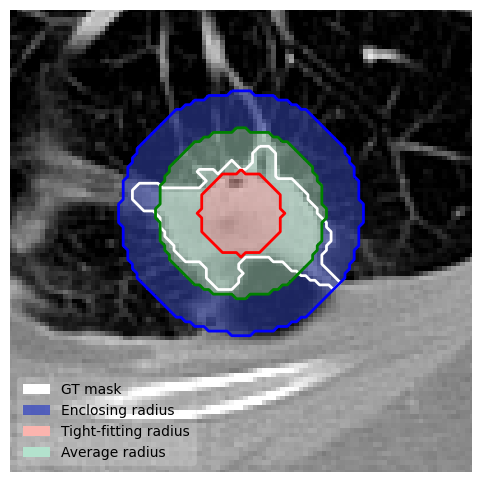

In [147]:
image = sample.image[:,:,0]
gt_mask = sample.gt_mask

fig, ax = plt.subplots(1,1, figsize=(6,6), frameon=False)
ax.imshow(image, cmap='gray')
ax.contour(gt_mask, levels=[0.5], colors='w', linewidths=2)
ax.axis('off')

ax.set_xlim(195,295)
ax.set_ylim(420,320)


clicker = DynamicClicker(gt_mask, mode='min', allow_overlap=True)
clicker.make_next_click(np.zeros_like(gt_mask))

clicks = predictor.get_points_nd([clicker.get_clicks()])
clicks[0,0,-1] = clicks[0,0,-1] -1
click_map_min = model.dist_maps(np.zeros((1, 1, 512, 512)), clicks)[0, 0].cpu()
ax.contour(click_map_min, levels=[0.5], colors='r', linewidths=2)
masked = np.ma.masked_where(click_map_min == 0, click_map_min)
ax.imshow(masked, cmap='Pastel1', alpha=0.5)

clicker = DynamicClicker(gt_mask, mode='avg', allow_overlap=True)
clicker.make_next_click(np.zeros_like(gt_mask))

clicks = predictor.get_points_nd([clicker.get_clicks()])
clicks[0,0,-1] = clicks[0,0,-1] + 1
click_map_avg = model.dist_maps(np.zeros((1, 1, 512, 512)), clicks)[0, 0].cpu()


ax.contour(click_map_avg, levels=[0.5], colors='g', linewidths=2)
click_map_avg = click_map_avg - click_map_min
masked = np.ma.masked_where(click_map_avg == 0, click_map_avg)
ax.imshow(masked, cmap='Pastel2', alpha=0.5)

clicker = DynamicClicker(gt_mask, mode='max', allow_overlap=True)
clicker.make_next_click(np.zeros_like(gt_mask))

clicks = predictor.get_points_nd([clicker.get_clicks()])
clicks[0,0,-1] = clicks[0,0,-1] + 2
click_map_max = model.dist_maps(np.zeros((1, 1, 512, 512)), clicks)[0, 0].cpu()
ax.contour(click_map_max, levels=[0.5], colors='b', linewidths=2)
click_map_max = click_map_max - click_map_avg - click_map_min
masked = np.ma.masked_where(click_map_max == 0, click_map_max)
ax.imshow(masked, cmap='coolwarm', alpha=0.5)


from matplotlib.patches import Patch
green_background = plt.get_cmap('Pastel2')(0)
green_background = (green_background[0], green_background[1], green_background[2], 1)
red_background = plt.get_cmap('Pastel1')(0)
red_background = (red_background[0], red_background[1], red_background[2], 1)
blue_background = plt.get_cmap('coolwarm')(0)
blue_background = (blue_background[0], blue_background[1], blue_background[2], 0.8)
white_background = (1, 1, 1, 1)

legend_handles = [
    Patch(facecolor=blue_background, label=f'Enclosing radius'),
    Patch(facecolor=red_background, label=f'Tight-fitting radius'),
    Patch(facecolor=green_background, label=f'Average radius'),
]
ax.legend(handles=legend_handles, loc='lower left', facecolor='white', framealpha=0.2)

plt.show()


In [14]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import base64

def show_animation(animation):
    html = animation.to_jshtml()
    return HTML(html)

def save_animation(animation, filename):
    animation.save(f'{filename}.gif', writer='pillow')

def generate_click_animation(image, gt_mask, iou_values, pos_click_maps, neg_click_maps, predictions, info_list):
    rows = np.any(gt_mask, axis=1)
    cols = np.any(gt_mask, axis=0)
    ymin, ymax = np.where(rows)[0][[0, -1]]
    xmin, xmax = np.where(cols)[0][[0, -1]]

    box_height = ymax - ymin
    box_width = xmax - xmin
    max_side = max(box_height, box_width) * 2

    center_y = ymin + box_height // 2
    center_x = xmin + box_width // 2
    half_side = max_side // 2

    square_ymin = max(0, center_y - half_side)
    square_ymax = min(image.shape[0], center_y + half_side)
    square_xmin = max(0, center_x - half_side)
    square_xmax = min(image.shape[1], center_x + half_side)

    fig, ax = plt.subplots(1, 4, figsize=(24, 8))

    iou_values = np.append(np.array([0]), iou_values)
    num_frames = len(predictions)
    
    for a in ax[:3]:
        a.axis('off')
        a.set_xlim(square_xmin, square_xmax)
        a.set_ylim(square_ymax, square_ymin)
        a.imshow(image, cmap='gray')
    
    ax[0].set_title('Initial', fontsize=20)
    ax[1].set_title(f'IOU: {iou_values[0]:.3f}', fontsize=20)

    ax[3].set_xticks(np.arange(1, len(iou_values) + 1))
    ax[3].set_ylim(0, 1.05)
    ax[3].set_xlabel('Clicks')
    ax[3].set_ylabel('IOU')
    ax[3].set_title('IOU after each click', fontsize=20)
    
    plt.close()
    
    def update(frame_index):
        for a in ax[:3]:
            a.imshow(image, cmap='gray')
            a.set_xlim(square_xmin, square_xmax)
            a.set_ylim(square_ymax, square_ymin)
        ax[0].set_title(f'Input', fontsize=20)

        ax[1].set_title(f'Clicks: {frame_index + 1}', fontsize=20)
        
        # Add contour of ground truth mask
        ax[1].contour(gt_mask, colors='w', levels=[0.5])  # Drawing contour in white color
        
        # Retrieve the ROI for the current frame
        roi = info_list[frame_index]['image_transforms']['roi']
        ymin, ymax, xmin, xmax = roi if roi is not None else (0, 512,  0, 512)
        # print(ymin, ymax, xmin, xmax)
        
        # Overlay for positive clicks
        pos_click_map = np.zeros_like(image)
        
        # print(pos_click_map[ymin:ymax, xmin:xmax].shawape, pos_click_maps[frame_index].shape)
        pos_click_map[ymin:ymax, xmin:xmax] = torch.nn.functional.interpolate(
            pos_click_maps[frame_index].unsqueeze(0).unsqueeze(0),
            size=(ymax - ymin, xmax - xmin),
            mode='bilinear',
            align_corners=True,
        ).squeeze(0).squeeze(0)
        # pos_click_map[pos_click_map > 0] = 1
        
        
        pos_overlay = np.ma.masked_where(pos_click_map == 0, pos_click_map)
        ax[1].imshow(np.dstack((np.zeros_like(pos_overlay), pos_overlay, np.zeros_like(pos_overlay), pos_overlay*0.5)), interpolation='nearest')

        # Overlay for negative clicks
        neg_click_map = np.zeros_like(image)
        neg_click_map[ymin:ymax, xmin:xmax] = torch.nn.functional.interpolate(
            neg_click_maps[frame_index].unsqueeze(0).unsqueeze(0),
            size=(ymax - ymin, xmax - xmin),
            mode='bilinear',
            align_corners=True,
        ).squeeze(0).squeeze(0)
        # neg_click_map[neg_click_map > 0] = 1
        
        neg_overlay = np.ma.masked_where(neg_click_map == 0, neg_click_map)
        ax[1].imshow(np.dstack((neg_overlay, np.zeros_like(neg_overlay), np.zeros_like(neg_overlay), neg_overlay*0.5)), interpolation='nearest')

        if frame_index < len(predictions):
            prediction_masked = np.ma.masked_where(predictions[frame_index] == 0, predictions[frame_index])
            ax[2].imshow(prediction_masked, alpha=0.5, cmap='gist_rainbow')
            ax[2].set_title(f'IOU: {iou_values[frame_index + 1]:.3f}', fontsize=20)
            
        ax[3].plot(np.arange(frame_index + 2), iou_values[:frame_index + 2], color='b')
        
        return
    
    animation = FuncAnimation(fig, update, frames=num_frames, interval=1000, blit=False)
    return animation

def extract_click_maps(info_list):
    pos_click_maps = []
    neg_click_maps = []
    for info in info_list:
        pos_click_maps.append(info['coarse_seg']['click_map'][0, 0].cpu())
        neg_click_maps.append(info['coarse_seg']['click_map'][0, 1].cpu())
    return pos_click_maps, neg_click_maps

pos_click_maps, neg_click_maps = extract_click_maps(info_list)

# anim = generate_click_animation(image[:, :, 0], gt_mask, ious_arr, pos_click_maps, neg_click_maps, pred_list, info_list)
# show_animation(anim)

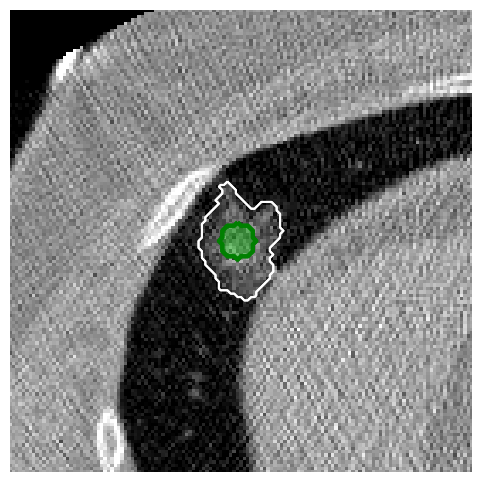

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import base64


def show_clicks(image, gt_mask, iou_values, pos_click_maps, neg_click_maps, predictions, info_list, frame_index):
    rows = np.any(gt_mask, axis=1)
    cols = np.any(gt_mask, axis=0)
    ymin, ymax = np.where(rows)[0][[0, -1]]
    xmin, xmax = np.where(cols)[0][[0, -1]]

    box_height = ymax - ymin
    box_width = xmax - xmin
    max_side = max(box_height, box_width) * 4

    center_y = ymin + box_height // 2
    center_x = xmin + box_width // 2
    half_side = max_side // 2

    square_ymin = max(0, center_y - half_side)
    square_ymax = min(image.shape[0], center_y + half_side)
    square_xmin = max(0, center_x - half_side)
    square_xmax = min(image.shape[1], center_x + half_side)

    fig, ax = plt.subplots(1, 1, figsize=(6, 6), frameon=False)
    plt.close()
    
    ax.axis('off')
    ax.set_xlim(square_xmin, square_xmax)
    ax.set_ylim(square_ymax, square_ymin)
    ax.imshow(image, cmap='gray')
    ax.contour(gt_mask, colors='w', levels=[0.5])
    
    # Add contour of ground truth mask
    ax.contour(gt_mask, colors='w', levels=[0.5])  # Drawing contour in white color
    
    # Retrieve the ROI for the current frame
    roi = info_list[frame_index]['image_transforms']['roi']
    ymin, ymax, xmin, xmax = roi if roi is not None else (0, 512,  0, 512)
    # print(ymin, ymax, xmin, xmax)
    
    # Overlay for positive clicks
    # model.dist_maps.norm_radius = 3
    # print(model.dist_maps.__class__)
    clicks = predictor.get_points_nd(info_list[frame_index]['raw_clicks'])
    click_maps = model.dist_maps(np.zeros((1, 1, 512, 512)), clicks)
    pos_click_map = click_maps[0, 0].cpu()
    neg_click_map = click_maps[0, 1].cpu()
    
    # pos_click_map = np.zeros_like(image)
    
    # pos_click_map[ymin:ymax, xmin:xmax] = torch.nn.functional.interpolate(
    #     pos_click_maps[frame_index].unsqueeze(0).unsqueeze(0),
    #     size=(ymax - ymin, xmax - xmin),
    #     mode='bilinear',
    #     align_corners=True,
    # ).squeeze(0).squeeze(0)
    # pos_click_map[pos_click_map > 0] = 1
    
    
    pos_overlay = np.ma.masked_where(pos_click_map == 0, pos_click_map)
    ax.imshow(np.dstack((np.zeros_like(pos_overlay), pos_overlay, np.zeros_like(pos_overlay), pos_overlay*0.3)), interpolation='nearest')
    # Overlay for negative clicks
    # neg_click_map = np.zeros_like(image)
    # neg_click_map[ymin:ymax, xmin:xmax] = torch.nn.functional.interpolate(
    #     neg_click_maps[frame_index].unsqueeze(0).unsqueeze(0),
    #     size=(ymax - ymin, xmax - xmin),
    #     mode='bilinear',
    #     align_corners=True,
    # ).squeeze(0).squeeze(0)
    # neg_click_map[neg_click_map > 0] = 1
    
    neg_overlay = np.ma.masked_where(neg_click_map == 0, neg_click_map)
    ax.imshow(np.dstack((neg_overlay, np.zeros_like(neg_overlay), np.zeros_like(neg_overlay), neg_overlay*0.3)), interpolation='nearest')
    
    for k in range(len(clicks[0])):
        for idx in range(len(clicks[0])):
            if k == clicks[0,idx,2]:
                i = idx
        current = clicks.clone()
        for j in range(len(clicks[0])):
            if j != i:
                current[0, j] = clicks[0, -1]	
        map = model.dist_maps(np.zeros((1, 1, 512, 512)), current)
        positive = i < len(clicks[0]) / 2
        cont = map[0, 0].cpu() if positive else map[0,1].cpu()
        ax.contour(cont, colors='g' if positive else 'r', levels=[0.5], linewidths=3)
    
    # print(clicks)
    # for k in range(len(clicks[0])):
    #     found = False
    #     for idx in range(len(clicks[0])):
    #         if k == clicks[0,idx,2]:
    #             i = idx
    #             found = True
    #     if not found:
    #         continue
    #     print(i)
    #     positive = i < len(clicks[0]) / 2
    #     raw_map = pos_click_maps[clicks[0,i,2]].unsqueeze(0).unsqueeze(0) if positive else neg_click_maps[clicks[0,i,2]].unsqueeze(0).unsqueeze(0)
    #     click_map = np.zeros_like(image)
    #     click_map[ymin:ymax, xmin:xmax] = torch.nn.functional.interpolate(
    #     raw_map,
    #     size=(ymax - ymin, xmax - xmin),
    #     mode='bilinear',
    #     align_corners=True,
    #     ).squeeze(0).squeeze(0)
    #     click_map[click_map > 0] = 1
    #     ax.contour(click_map, colors='g' if positive else 'r', levels=[0.5], linewidths=3)
        

    
    return fig
    
pos_click_maps, neg_click_maps = extract_click_maps(info_list)

show_clicks(image[:, :, 0], gt_mask, ious_arr, pos_click_maps, neg_click_maps, pred_list, info_list, 0)

(158.0, 22.0)

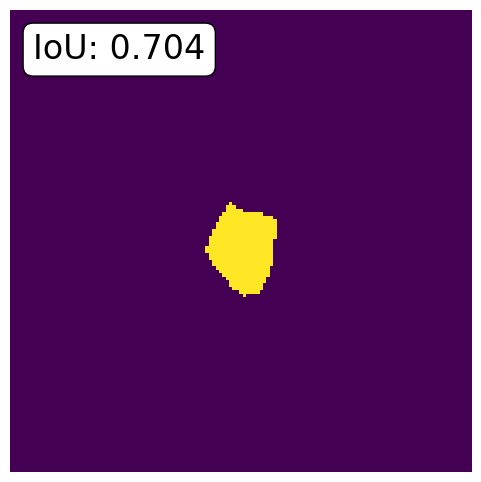

In [16]:
rows = np.any(gt_mask, axis=1)
cols = np.any(gt_mask, axis=0)
ymin, ymax = np.where(rows)[0][[0, -1]]
xmin, xmax = np.where(cols)[0][[0, -1]]
box_height = ymax - ymin
box_width = xmax - xmin
max_side = max(box_height, box_width) * 4
center_y = ymin + box_height // 2
center_x = xmin + box_width // 2
half_side = max_side // 2
square_ymin = max(0, center_y - half_side)
square_ymax = min(image.shape[0], center_y + half_side)
square_xmin = max(0, center_x - half_side)
square_xmax = min(image.shape[1], center_x + half_side)
fig, ax = plt.subplots(1, 1, figsize=(6, 6), frameon=False)
index = 0

ax.imshow(pred_list[index])
ax.axis('off')
props = dict(boxstyle='round', facecolor='white', alpha=1)
ax.text(0.05, 0.95, f'IoU: {ious_arr[index]:.3f}', transform=ax.transAxes, fontsize=24,
        verticalalignment='top', bbox=props)
ax.axis('off')
ax.set_xlim(square_xmin, square_xmax)
ax.set_ylim(square_ymax, square_ymin)

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import base64

def show_animation(animation):
    html = animation.to_jshtml()
    return HTML(html)

def save_animation(animation, filename):
    animation.save(f'{filename}.gif', writer='pillow')

def generate_click_animation(gt_mask, iou_values, predictions, info_list):
    fig, ax = plt.subplots(1, 3, figsize=(18, 8))

    iou_values = np.append(np.array([0]), iou_values)
    num_frames = len(predictions)
    # num_frames = 2
    
    full_size_image = info_list[0]['image_transforms']['image_nd'].cpu()[0, 0]
    
    for a in ax[:3]:
        a.axis('off')
        a.imshow(full_size_image, cmap='gray')
        
    ax[0].contour(gt_mask, colors='w', levels=[0.5])
        
    
    ax[0].set_title('Scan with GT mask', fontsize=20)
    ax[2].set_title(f': {iou_values[0]:.3f}', fontsize=20)
    
    
    plt.close()
    
    def update(frame_index):
        image = info_list[frame_index]['image_transforms']['image_nd'].cpu()[0, 0]
        
        prediction_before_sigmoid = info_list[frame_index]['coarse_seg']['outputs']['instances'].cpu()[0, 0]
        prediction = (torch.sigmoid(prediction_before_sigmoid) > 0.5).numpy()
        
        print(np.sum(prediction), np.sum(gt_mask))
        if np.sum(prediction) > 0:
            rows = np.any(prediction, axis=1)
            cols = np.any(prediction, axis=0)
        else:
            rows = np.any(gt_mask, axis=1)
            cols = np.any(gt_mask, axis=0)
        ymin, ymax = np.where(rows)[0][[0, -1]]
        xmin, xmax = np.where(cols)[0][[0, -1]]

        box_height = ymax - ymin
        box_width = xmax - xmin
        max_side = max(box_height, box_width) * 5

        center_y = ymin + box_height // 2
        center_x = xmin + box_width // 2
        half_side = max_side // 2

        square_ymin = max(0, center_y - half_side)
        square_ymax = min(image.shape[0], center_y + half_side)
        square_xmin = max(0, center_x - half_side)
        square_xmax = min(image.shape[1], center_x + half_side)
        
        roi = info_list[frame_index]['image_transforms']['roi']
        ymin, ymax, xmin, xmax = roi if roi is not None else (0, 511,  0, 511)
        
        zoomed_gt_mask = torch.nn.functional.interpolate(
            torch.tensor(gt_mask.astype(float))[ymin:ymax, xmin:xmax].unsqueeze(0).unsqueeze(0),
            size=400,
            mode='nearest',
        ).squeeze(0).squeeze(0) > 0
        
        for a in ax[1:]:
            a.clear()
            a.imshow(image, cmap='gray')
            a.axis('off')
            # a.set_xlim(square_xmin, square_xmax)
            # a.set_ylim(square_ymax, square_ymin)
        ax[0].set_title(f'Input', fontsize=20)

        ax[1].set_title(f'Clicks: {frame_index + 1}', fontsize=20)
        ax[1].contour(zoomed_gt_mask, colors='w', levels=[0.5])
        
        pos_click_map = info_list[frame_index]['coarse_seg']['click_map'].cpu()[0, 0]
        pos_overlay = np.ma.masked_where(pos_click_map == 0, pos_click_map)
        ax[1].imshow(np.dstack((np.zeros_like(pos_overlay), pos_overlay, np.zeros_like(pos_overlay), pos_overlay*0.5)), interpolation='nearest')
        
        neg_click_map = info_list[frame_index]['coarse_seg']['click_map'].cpu()[0, 1]
        neg_overlay = np.ma.masked_where(neg_click_map == 0, neg_click_map)
        ax[1].imshow(np.dstack((neg_overlay, np.zeros_like(neg_overlay), np.zeros_like(neg_overlay), neg_overlay*0.5)), interpolation='nearest')

        
        if frame_index < len(predictions):
            prediction_masked = np.ma.masked_where(prediction == 0, prediction)
            ax[2].imshow(prediction_masked, alpha=0.5, cmap='gist_rainbow')
            ax[2].set_title(f'IOU: {iou_values[frame_index + 1]:.3f}', fontsize=20)
        
        return
    
    animation = FuncAnimation(fig, update, frames=num_frames, interval=1000, blit=False)
    return animation

anim = generate_click_animation(gt_mask, ious_arr, pred_list, info_list)
show_animation(anim)

14 153
14 153
111 153
147 153
179 153
252 153
325 153
375 153
441 153
512 153
534 153
518 153
518 153
520 153
528 153
538 153
475 153
483 153
489 153
507 153
459 153


# Visualise each part

In [11]:
step_info = info_list[1]

(-0.5, 399.5, 399.5, -0.5)

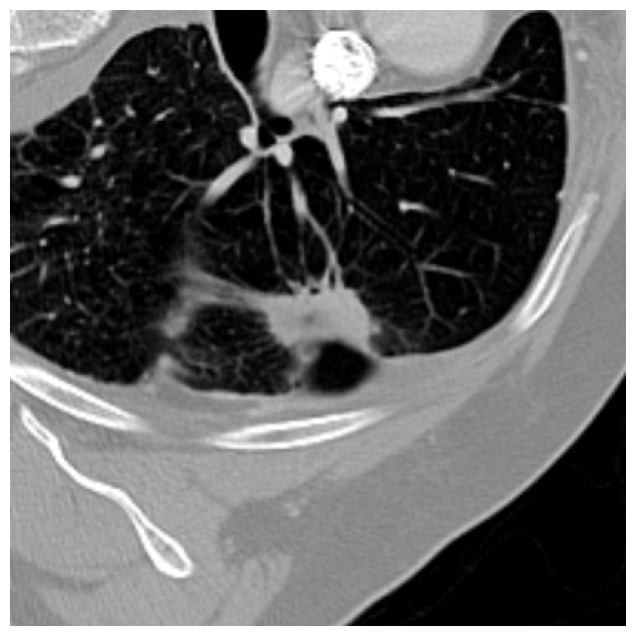

In [12]:
image = step_info['image_transforms']['image_nd'].cpu()[0, 0]
fig, ax = plt.subplots(1, 1, figsize=(8, 8), frameon=False)
ax.imshow(image, cmap='gray')
ax.axis('off')

[347] [242] ['lime']


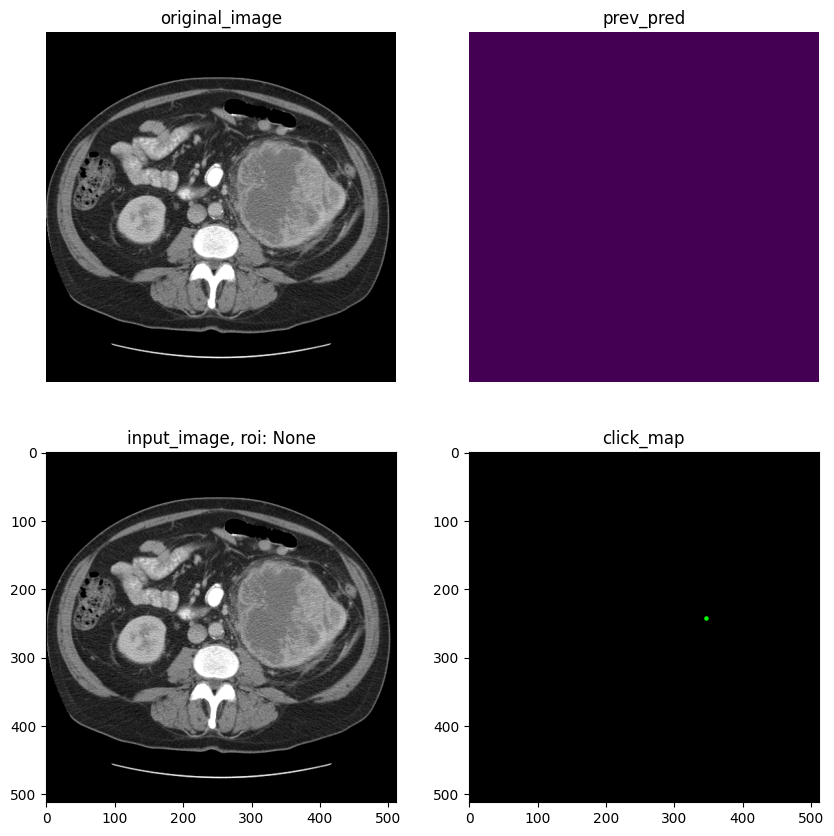

In [19]:
def show_before_coarse(info):
    fig, ax = plt.subplots(2, 2, figsize=(10, 10))
    plt.close()
    
    ax[0,0].set_title('original_image')
    ax[0,0].imshow(info['original_image'][0], cmap='gray')
    ax[0,0].axis('off')
    
    ax[0,1].set_title('prev_pred')
    ax[0,1].imshow(info['prev_mask'])
    ax[0,1].axis('off')
    
    ax[1,0].set_title(f"input_image, roi: {info['image_transforms']['roi']}")
    ax[1,0].imshow(info['image_transforms']['image_nd'].cpu()[0, 0], cmap='gray')
    # ax[1,0].axis('off')
    
    ax[1,1].set_title('click_map')
    ax[1,1].imshow(info['image_transforms']['image_nd'].cpu()[0, 3], cmap='gray')
    # ax[1,1].axis('off')
    
    y = [click.coords[0] for click in info['image_transforms']['clicks_lists'][0]]
    x = [click.coords[1] for click in info['image_transforms']['clicks_lists'][0]]
    c = [click.is_positive for click in info['image_transforms']['clicks_lists'][0]]
    c = ['lime' if i else 'red' for i in c]
    
    print(x,y,c)
    ax[1,1].scatter(x, y, c=c, s=5)
    
    return fig

show_before_coarse(step_info)

In [34]:
def show_coarse_input(info):
    
    info = info['coarse_seg']
    
    fig, ax = plt.subplots(3, 2)
    plt.close()
    
    ax[0, 0].set_title('input_image')
    ax[0, 0].imshow(info['prepared_input']['image'].cpu()[0, 0], cmap='gray')
    
    ax[0, 1].set_title('prev_mask')
    ax[0, 1].imshow(info['prepared_input']['prev_mask'].cpu()[0, 0])
    
    ax[1, 0].set_title(f'pos_clicks: {info["click_map"].cpu()[0, 0].sum()}')
    ax[1, 0].imshow(info['click_map'].cpu()[0, 0])
    
    ax[1, 1].set_title(f'neg_clicks {info["click_map"].cpu()[0, 1].sum()}')
    ax[1, 1].imshow(info['click_map'].cpu()[0, 1])
    
    ax[2, 0].set_title(f'pos_clicks: {info["click_map"].cpu()[0, 0].sum()}')
    ax[2, 0].imshow(info['prepared_input']['image'].cpu()[0, 0], cmap='gray')
    overlay = np.ma.masked_where(info['click_map'].cpu()[0, 0] == 0, info['click_map'].cpu()[0, 0])
    ax[2, 0].imshow(np.dstack((overlay, np.zeros_like(overlay), np.zeros_like(overlay), overlay*1)), interpolation='nearest')
    
    ax[2, 1].axis('off')
    
    
    return fig

show_coarse_input(step_info)

NameError: name 'step_info' is not defined

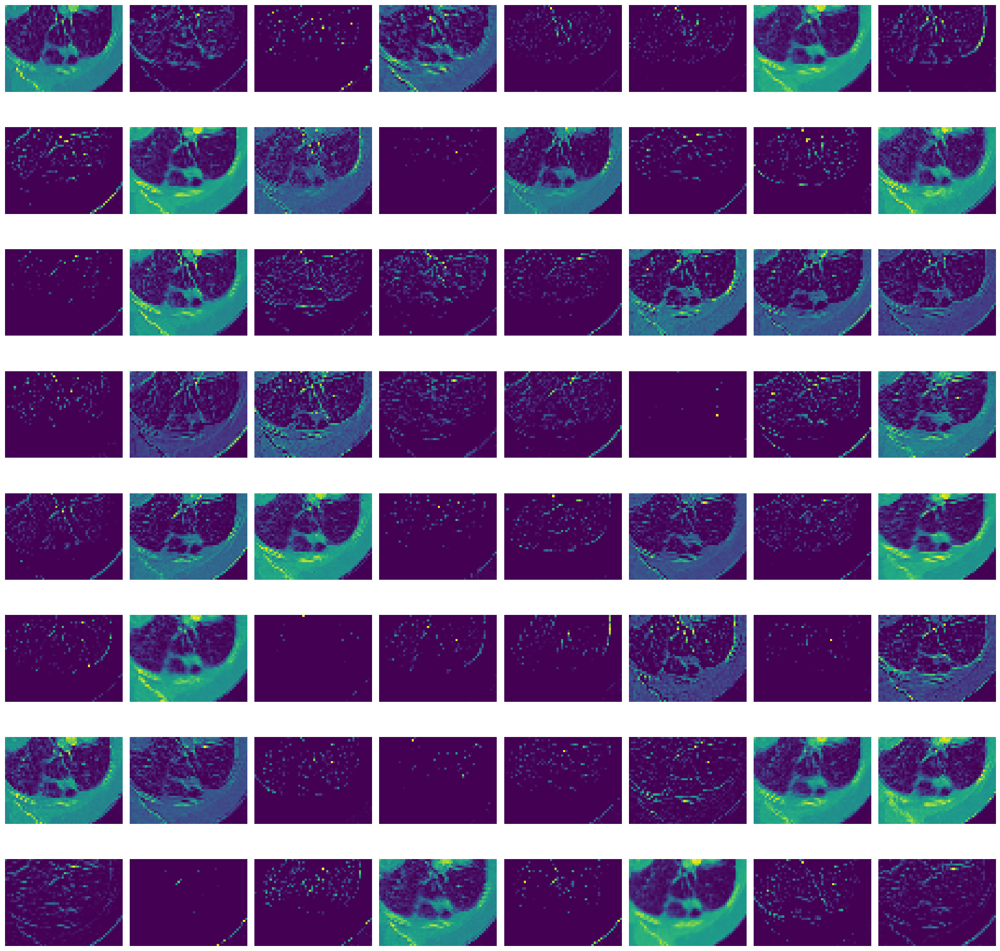

In [15]:
import torch
import matplotlib.pyplot as plt
import numpy as np

feature_maps = step_info['coarse_seg']['outputs']['pre_stage_features'].cpu()[0]


# Identify the bounding box in GT mask
gt_mask_np = gt_mask
rows = np.any(gt_mask_np, axis=1)
cols = np.any(gt_mask_np, axis=0)
rmin, rmax = np.where(rows)[0][[0, -1]]
cmin, cmax = np.where(cols)[0][[0, -1]]

# Scale bounding box to feature map resolution
scale_factor = 128 / 512
bbox = [rmin, rmax, cmin, cmax]
scaled_bbox = [int(x * scale_factor) for x in bbox]

# Expand the area by 5x, and ensure it's within feature map bounds
# Calculate center and size of the original bounding box
center = [(scaled_bbox[1] + scaled_bbox[0]) // 2, (scaled_bbox[3] + scaled_bbox[2]) // 2]
size = [(scaled_bbox[1] - scaled_bbox[0]) * 5, (scaled_bbox[3] - scaled_bbox[2]) * 5]

# Apply expansion but ensure within bounds
expanded_bbox = [
    max(0, center[0] - size[0] // 2),
    min(128, center[0] + size[0] // 2),
    max(0, center[1] - size[1] // 2),
    min(128, center[1] + size[1] // 2),
]

# Visualize the feature maps within the expanded bounding box area
fig, axes = plt.subplots(8, 8, figsize=(20, 20))  # Adjust as needed
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < feature_maps.shape[0]:
        # Extract the relevant area from the feature map
        feature_map_zoomed = feature_maps[i, expanded_bbox[0]:expanded_bbox[1], expanded_bbox[2]:expanded_bbox[3]]
        ax.imshow(feature_map_zoomed)
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

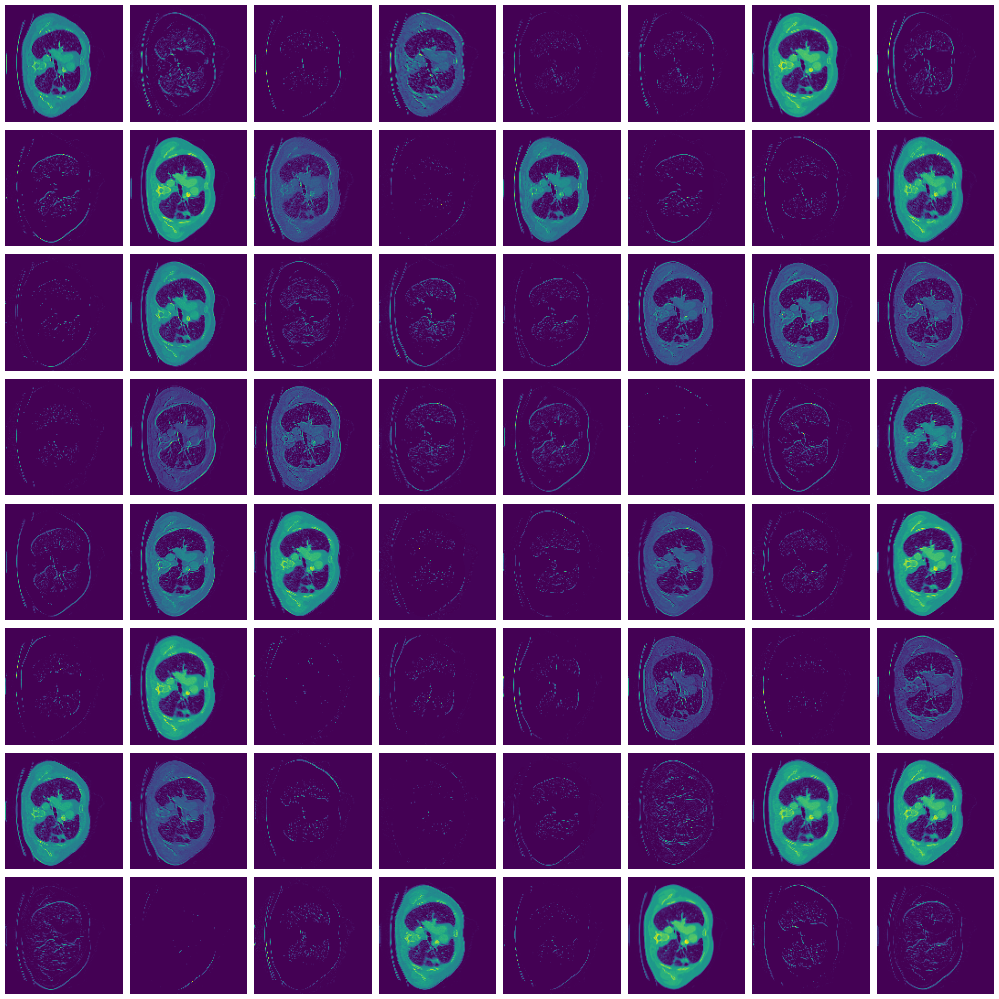

In [16]:
import torch
import matplotlib.pyplot as plt

# Assuming tensor is your torch.Size([64, 128, 128]) tensor
# For demonstration, let's create a dummy tensor with random values
tensor = feature_maps
# Number of feature maps
num_feature_maps = tensor.shape[0]

# Determine the grid size for plotting
# For simplicity, we will create a square grid that can hold all the feature maps
grid_size = int(num_feature_maps**0.5) if int(num_feature_maps**0.5)**2 == num_feature_maps else int(num_feature_maps**0.5) + 1

fig, axes = plt.subplots(grid_size, grid_size, figsize=(20, 20))

# Flatten axes array for easy indexing
axes = axes.flatten()

for i in range(num_feature_maps):
    # Plot each feature map
    ax = axes[i]
    ax.imshow(tensor[i])
    ax.axis('off')  # Turn off axis numbers and ticks

# Turn off the axes of any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

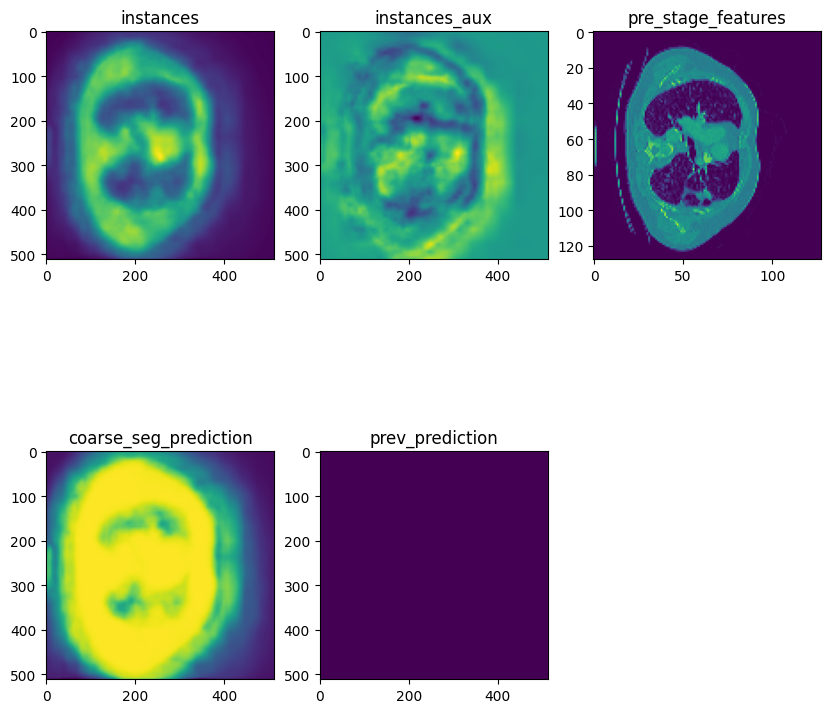

In [17]:
def show_coarse_predictions(info):

    fig, ax = plt.subplots(2, 3, figsize=(10, 10))
    plt.close()
    
    ax[0, 0].set_title('instances')
    ax[0, 0].imshow(info['coarse_seg']['outputs']['instances'].cpu()[0, 0])
    
    ax[0, 1].set_title('instances_aux')
    ax[0, 1].imshow(info['coarse_seg']['outputs']['instances_aux'].cpu()[0, 0])
    
    ax[0, 2].set_title('pre_stage_features')
    ax[0, 2].imshow(info['coarse_seg']['outputs']['pre_stage_features'].cpu()[0, 0])
    
    ax[1, 0].set_title('coarse_seg_prediction')
    new_mask = torch.sigmoid(info['coarse_seg']['outputs']['instances'].cpu()[0, 0]).numpy()
    ax[1, 0].imshow(new_mask)
    
    ax[1,1].set_title('prev_prediction')
    ax[1,1].imshow(info['coarse_seg']['prepared_input']['prev_mask'].cpu()[0, 0])
    
    fig.delaxes(ax[1,2])
    
    return fig

show_coarse_predictions(step_info)

# Animation code

In [22]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import base64
from isegm.ritm.inference.transforms.zoom_in import get_roi_image_nd

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import base64

def show_animation(animation):
    html = animation.to_jshtml()
    return HTML(html)

def save_animation(animation, filename):
    animation.save(f'{filename}.gif', writer='pillow')
    
def generate_click_animation(image, gt_mask, iou_values, clicks, predictions, info_list):
    fig, ax = plt.subplots(2, 3, figsize=(9, 7))
    if len(image.shape) == 3:
        image = image[:, :, 0]
        
    num_frames = len(clicks)
        
    ax[0,0].imshow(image, cmap='gray')
    ax[0,0].axis('off')
    ax[0,0].set_title('Image, gt mask,\nClicks', fontsize=20)
    ax[0,0].contour(gt_mask, colors='b', alpha=0.5, linewidths=0.1)

    ax[1, 1].set_title('Coarse logits')
    
    plt.close()
    
    def update(frame_index):
        
        fig.suptitle(f'Click {frame_index + 1}', fontsize=20)
        
        ax[0,0].imshow(image, cmap='gray')
        ax[0,0].set_title(f'Clicks: {frame_index + 1}', fontsize=20)
        ax[0,0].contour(gt_mask, colors='b', alpha=0.5, linewidths=0.1)
        for click in clicks[:frame_index + 1]:
            color = 'lime' if click.is_positive else 'r'
            y, x = click.coords
            ax[0,0].scatter(x, y, s=10, c=color)
            
        ax[0,1].clear()
        ax[0,1].set_title('Previous predicition', fontsize=20)
        ax[0,1].axis('off')
        ax[0,1].imshow(info_list[frame_index]['prev_mask'])
        
        ax[0,2].clear()
        ax[0,2].axis('off')
        ax[0,2].set_title(f'Input image', fontsize=20)
        ax[0,2].imshow(info_list[frame_index]['image_transforms']['image_nd'].cpu()[0, 0], cmap='gray')
        
        image_transforms = info_list[frame_index]['image_transforms']
        click_map = image_transforms['image_nd'].cpu()[0, 3]
        coarse_seg = info_list[frame_index]['coarse_seg']
        pos_clicks = coarse_seg['click_map'].cpu()[0, 0]
        neg_clicks = coarse_seg['click_map'].cpu()[0, 1]
        
        
        roi = info_list[frame_index]['image_transforms']['roi']
        if roi is not None:
            cropped_mask = get_roi_image_nd(torch.tensor(gt_mask).float().unsqueeze(0).unsqueeze(0), roi, 400)
            cropped_mask = cropped_mask.squeeze(0).squeeze(0)
        else:
            cropped_mask = gt_mask
        
        ax[1,0].clear()
        ax[1,0].set_title('Click map', fontsize=20)
        ax[1,0].axis('off')
        ax[1,0].imshow(image_transforms['image_nd'].cpu()[0, 3], cmap='gray')
        ax[1,0].contour(cropped_mask, colors='b', alpha=0.5, linewidths=0.2)
        pos_masked = np.ma.masked_where(pos_clicks == 0, pos_clicks)
        neg_masked = np.ma.masked_where(neg_clicks == 0, neg_clicks)
        
        ax[1,0].imshow(np.dstack((neg_masked, np.zeros_like(neg_masked), np.zeros_like(neg_masked), neg_masked*0.5)), interpolation='nearest')
        ax[1,0].imshow(np.dstack((np.zeros_like(pos_masked), pos_masked, np.zeros_like(pos_masked), pos_masked*0.5)), interpolation='nearest')
        
        ax[1,1].clear()
        ax[1,1].set_title('Prediction', fontsize=20)
        ax[1,1].axis('off')
        ax[1,1].imshow(info_list[frame_index]['coarse_seg_prediction'])
        
        ax[1,2].clear()
        ax[1,2].axis('off')
        iou = str(np.round(iou_values[frame_index], 3))
        ax[1,2].set_title(f'Final mask (IoU: {iou})', fontsize=20)
        ax[1,2].imshow(predictions[frame_index])
        
        return
    
    animation = FuncAnimation(fig, update, frames=num_frames, interval=1000, blit=False)
    return animation

In [23]:
anim = generate_click_animation(image, gt_mask, ious_arr, clicks_list, pred_list, info_list)

show_animation(anim)